https://stackoverflow.com/questions/38713746/python-numpy-conditional-simulation-from-a-multivatiate-distribution

https://python.quantecon.org/multivariate_normal.html

In [1]:
using Distributions
using Plots
using LinearAlgebra



In [2]:
μ = [1, 3]
Σ = [1 1/2; 1/2 1]

μ, Σ

([1, 3], [1.0 0.5; 0.5 1.0])

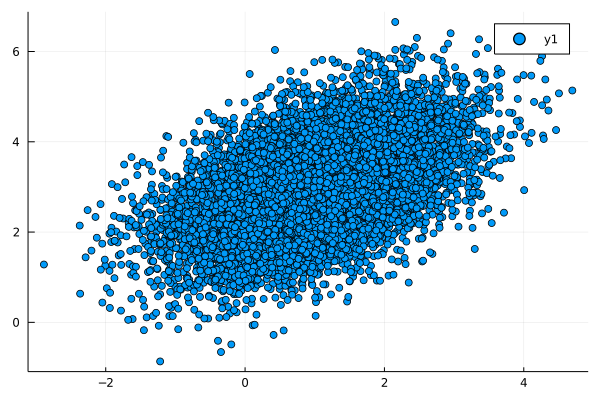

In [4]:
x = rand(MvNormal(μ, Σ), 10000)
scatter(x[1,:], x[2,:])

In [21]:
# mean = [1, 2, 3, 4]
# covv = [1.0  0.5  0.3 -0.1; 
#        0.5  1.0  0.1 -0.2; 
#        0.3  0.1  1.0 -0.3; 
#       -0.1 -0.2 -0.3  0.1]



mean = [1, 2, 3]
covv = [1.0  0.5  0.3; 
       0.5  1.0  0.1; 
       0.3  0.1  1.0]

conditional_MvNormal(mean, covv, [2, 3], [2, 3])

([1.0], [0.6868686868686869])

In [7]:
mean = [1, 2]
covv = [1 1/3;
       1/3 1]

conditional_MvNormal(mean, covv, [2], [2])

([1.0], [0.8888888888888888])

In [26]:
mean = [1, 2, 3, 4]
covv = [1.0  0.5  0.3 -0.1; 
       0.5  1.0  0.1 -0.2; 
       0.3  0.1  1.0 -0.3; 
      -0.1 -0.2 -0.3  0.1]
conditional_MvNormal(mean, covv, [1, 1, 1], [2, 3, 4])

([13.789473684210533], [0.9473684210526317])

In [4]:
function conditional_MvNormal(mean, covv, a, idx2)
    dims = size(mean)[1]
    # indexes of dependent variables
    idx1 = sort(collect(setdiff(Set(1:dims), Set(idx2))))
    μ1 = mean[idx1]
    μ2 = mean[idx2]
    Σ11 = covv[idx1, idx1]
    Σ21 = covv[idx2, idx1]
    Σ12 = covv[idx1, idx2]
    Σ22 = covv[idx2, idx2]
    
    μ1_ = μ1 + Σ12 * inv(Σ22) * (a - μ2)
    Σ1_ = Σ11 - Σ12 * inv(Σ22) * Σ21
    return μ1_, Σ1_
end

conditional_MvNormal (generic function with 1 method)

[1.0][0.8888888888888888]


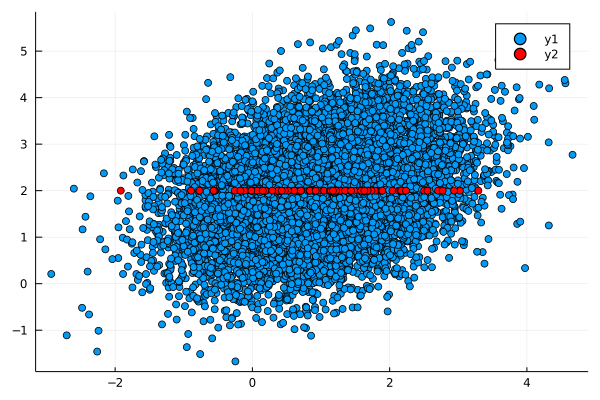

In [104]:
# bivariate 

mean = [1, 2]
covv = [1 1/3;
       1/3 1]
a = [2]

μ1 = mean[1:1]
μ2 = mean[2:2]
Σ11 = covv[1:1, 1:1]
Σ21 = covv[2:2, 1:1]
Σ12 = covv[1:1, 2:2]
Σ22 = covv[2:2, 2:2]

μ1_ = μ1 + Σ12 * inv(Σ22) * (a - μ2)
Σ1_ = Σ11 - Σ12 * inv(Σ22) * Σ21

println(μ1_, Σ1_)
x1 = rand(MvNormal(mean, covv), 10000)
x2 = rand(MvNormal(μ1_, Σ1_), 100)
scatter(x1[1,:], x1[2,:])
scatter!(x2[1,:], repeat(a, 100), color="red")

[1.0 0.5; 0.5 1.0]
[0.3; 0.1]
[0.3 0.1]
[1.0]
[0.7, 1.9][0.91 0.47; 0.47 0.99]


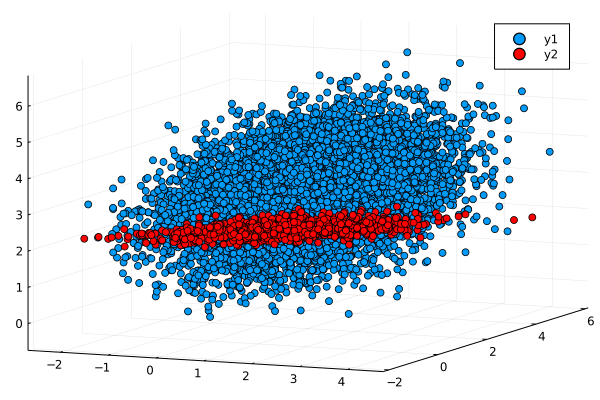

In [125]:
# three variables, condition in one 

mean = [1, 2, 3]
covv = [1.0  0.5  0.3; 
       0.5  1.0  0.1; 
       0.3  0.1  1.0]
a = [2]

μ1 = mean[1:2]
μ2 = mean[3:3]
Σ11 = covv[1:2, 1:2]
Σ21 = covv[3:3, 1:2]
Σ12 = covv[1:2, 3:3]
Σ22 = covv[3:3, 3:3]

println(Σ11)
println(Σ12)
println(Σ21)
println(Σ22)

μ1_ = μ1 + Σ12 * inv(Σ22) * (a - μ2)
Σ1_ = Σ11 - Σ12 * inv(Σ22) * Σ21

println(μ1_, Σ1_)
x1 = rand(MvNormal(mean, covv), 10000)
x2 = rand(MvNormal(μ1_, Σ1_), 1000)
scatter(x1[1,:], x1[2,:], x1[3,:])
scatter!(x2[1,:], x2[2,:], repeat(a, 1000), color="red")

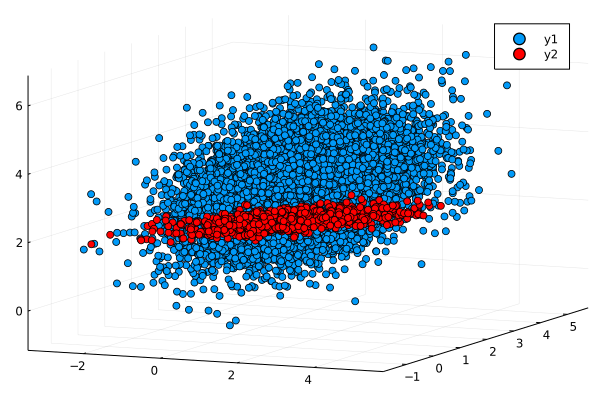

In [126]:
μ1_, Σ1_ = conditional_MvNormal(mean, covv, a, [3])

x1 = rand(MvNormal(mean, covv), 10000)
x2 = rand(MvNormal(μ1_, Σ1_), 1000)
scatter(x1[1,:], x1[2,:], x1[3,:])
scatter!(x2[1,:], x2[2,:], repeat(a, 1000), color="red")

[1.595959595959596][0.7474747474747474]


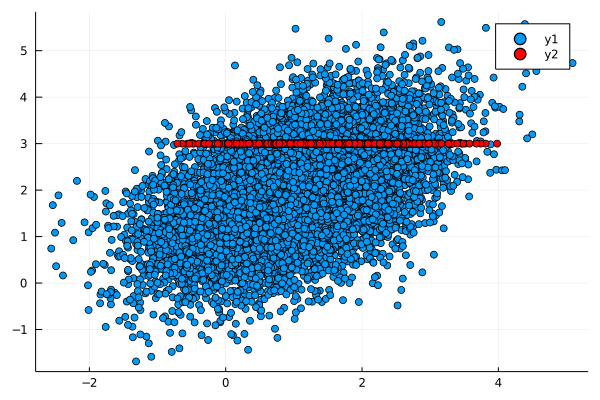

In [141]:
# three variables, condition in two 

mean = [1, 2, 1]
covv = [1.0  0.5  0.1; 
       0.5  1.0  0.1; 
       0.1  0.1  1.0]
a = [3, 3]

μ1 = mean[1:1]
μ2 = mean[2:3]
Σ11 = covv[1:1, 1:1]
Σ21 = covv[2:3, 1:1]
Σ12 = covv[1:1, 2:3]
Σ22 = covv[2:3, 2:3]

μ1_ = μ1 + Σ12 * inv(Σ22) * (a - μ2)
Σ1_ = Σ11 - Σ12 * inv(Σ22) * Σ21

println(μ1_, Σ1_)
x1 = rand(MvNormal(mean, covv), 10000)
x2 = rand(MvNormal(μ1_, Σ1_), 500)
scatter(x1[1,:], x1[2,:])
scatter!(x2[1,:], repeat(a[1:1], 500), color="red")

[1.595959595959596][0.7474747474747474]


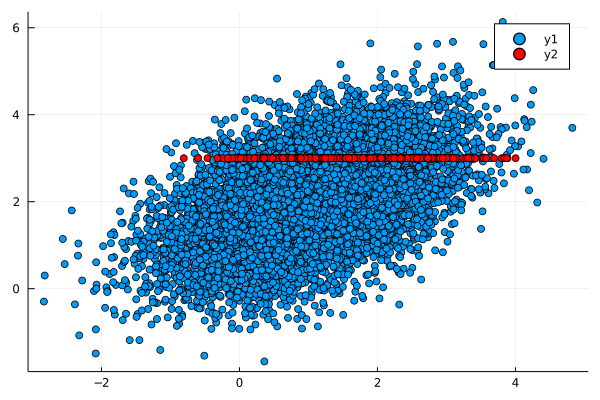

In [142]:
μ1_, Σ1_ = conditional_MvNormal(mean, covv, a, [2,3])

println(μ1_, Σ1_)
x1 = rand(MvNormal(mean, covv), 10000)
x2 = rand(MvNormal(μ1_, Σ1_), 500)
scatter(x1[1,:], x1[2,:])
scatter!(x2[1,:], repeat(a[1:1], 500), color="red")

# gibbs sampling: 
- start with a point $X_0$
- choose one dimension and condition in the others, to calculate the new value in that dimension
- repeat

3

In [216]:
num_dims = 3
mean = [1, 2, 3]
covv = [1.0  0.5  0.1; 
        0.5  1.0  0.1; 
        0.1  0.1  1.0]
x = [0., 0., 0.]

dims_idxs = [
    [2,3], # to evaluate dimension 1, condition in 2 and 3
    [1,2], # ...
    [1,2]
]
N = 100000

samples = zeros(3, N)

for i in 1:N
    # dim = 1+(i-1)%num_dims
    dim = rand([1,2,3])
    idx = dims_idxs[dim]
    μ1_, Σ1_ = conditional_MvNormal(mean, covv, x[idx], idx)
    x[dim] = rand(MvNormal(μ1_, Σ1_))[1]
    samples[:, i] .= x
end

good_samples = samples[:,50000:end]

Distributions.cov(transpose(good_samples))

3×3 Array{Float64,2}:
 1.01891   0.301637   0.083908
 0.301637  1.00522    0.0414783
 0.083908  0.0414783  1.00402

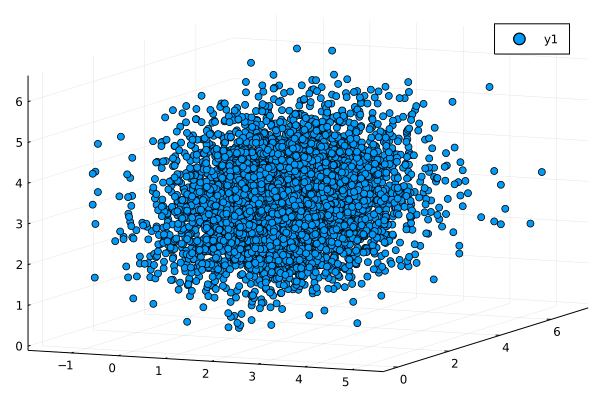

In [192]:
scatter(good_samples[1,1:5000], good_samples[2,1:5000], good_samples[3,1:5000])

3×3 Array{Float64,2}:
 1.01308    0.295091   0.0790993
 0.295091   1.0074     0.0473696
 0.0790993  0.0473696  1.0073